# Part 2: Integrating Simple Obstacles

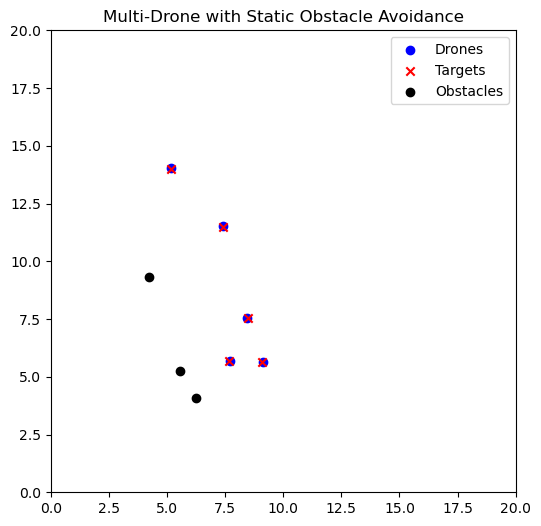

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Simulation settings
n_drones = 5
n_obstacles = 3
positions = np.random.rand(n_drones, 2) * 10  # Random starting points
targets = np.random.rand(n_drones, 2) * 10 + 5  # Random targets shifted away
obstacles = np.random.rand(n_obstacles, 2) * 10  # Random static obstacles
learning_rate = 0.05  # Step size towards target
avoidance_radius = 1  # Radius to trigger avoidance behavior

fig, ax = plt.subplots(figsize=(6,6))
sc = ax.scatter(positions[:,0], positions[:,1], c='blue', label='Drones')
target_sc = ax.scatter(targets[:,0], targets[:,1], c='red', marker='x', label='Targets')
obstacle_sc = ax.scatter(obstacles[:,0], obstacles[:,1], c='black', label='Obstacles')
ax.set_xlim(0, 20)
ax.set_ylim(0, 20)
ax.legend()
ax.set_title('Multi-Drone with Static Obstacle Avoidance')

# Pause control
is_paused = False

def update(frame):
    global positions, is_paused
    if not is_paused:
        for i in range(n_drones):
            # Calculate direction toward target
            direction = targets[i] - positions[i]
            
            # Check for nearby obstacles
            for j in range(n_obstacles):
                distance_to_obstacle = np.linalg.norm(positions[i] - obstacles[j])
                if distance_to_obstacle < avoidance_radius:  # If obstacle is too close
                    # Adjust direction to avoid the obstacle
                    direction += (positions[i] - obstacles[j]) * 0.5  # Move away from the obstacle
            
            # Normalize the direction and apply learning rate
            direction = direction / np.linalg.norm(direction)  # Normalize
            positions[i] += learning_rate * direction  # Move drone towards the target (with avoidance)
        
        sc.set_offsets(positions)
    return sc,

def on_click(event):
    global is_paused
    if event.inaxes is not None:
        is_paused = not is_paused

# Connect pause/play
fig.canvas.mpl_connect('button_press_event', on_click)

# Animate
anim = FuncAnimation(fig, update, frames=300, interval=100, blit=True)

# Display
HTML(anim.to_jshtml())